<a href="https://www.kaggle.com/code/nigamshitij/stable-diffusion-iniital-experiments?scriptVersionId=177428211" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/stable-diffusion-initialization-experiments/horsie.jpg


In [3]:
!pip install -Uq diffusers transformers fastcore

In [4]:
# boilerplate imports
import logging
from pathlib import Path

import matplotlib.pyplot as plt
import torch

from diffusers import StableDiffusionPipeline
from fastcore.all import concat
from huggingface_hub import notebook_login
from PIL import Image

logging.disable(logging.WARNING)
torch.manual_seed(1)

if not (Path.home()/'.cache/huggingface'/'token').exists():
    notebook_login()

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

2024-05-13 12:50:47.552840: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-13 12:50:47.552948: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-13 12:50:47.732176: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [5]:
# download pre-trained weights
# set precision to fp16
# compvis is repo ID of pretrained pipeline

model_name = "CompVis/stable-diffusion-v1-4"
variant = "fp16"
pipe = StableDiffusionPipeline.from_pretrained(
    model_name,
    variant = variant,
    torch_dtype = torch.float16
).to("cuda")

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

text_encoder/model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

safety_checker/model.fp16.safetensors:   0%|          | 0.00/608M [00:00<?, ?B/s]

safety_checker/config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/313 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

(…)kpoints/scheduler_config-checkpoint.json:   0%|          | 0.00/209 [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

(…)diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/1.72G [00:00<?, ?B/s]

(…)diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/551 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [6]:
# enable attention slicing to save memory (compromises speed)
pipe.enable_attention_slicing()

  0%|          | 0/50 [00:00<?, ?it/s]

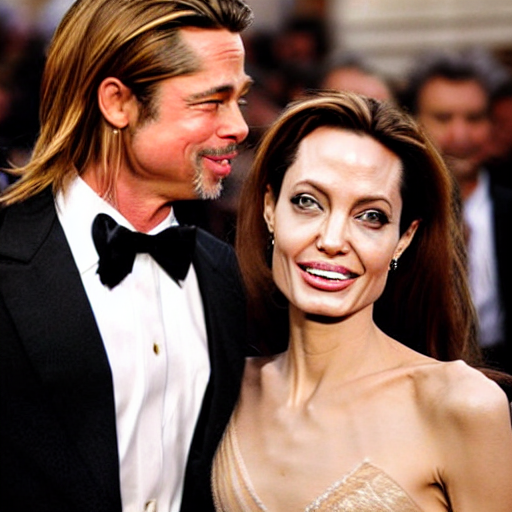

In [7]:
# test prompts!
prompt = "a hollywood couple that looks like brad pitt and angelina jolie"
pipe(prompt).images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

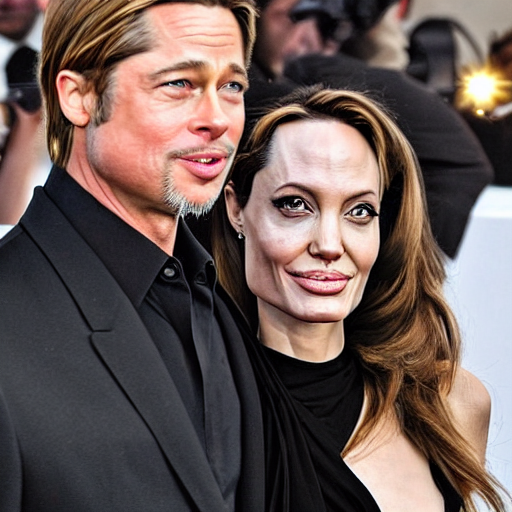

In [8]:
torch.manual_seed(1024)
pipe(prompt).images[0]

  0%|          | 0/5 [00:00<?, ?it/s]

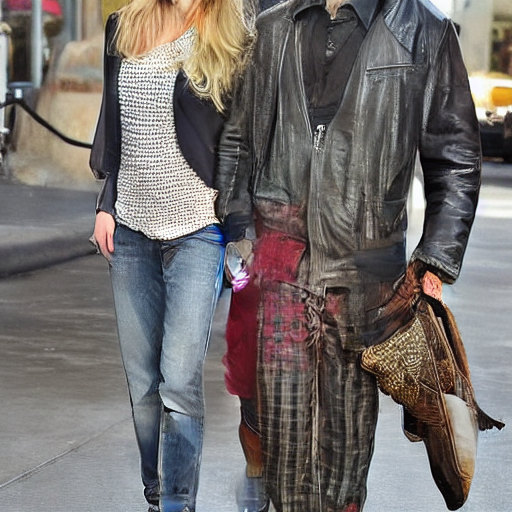

In [9]:
torch.manual_seed(1024)
pipe(prompt, num_inference_steps = 5).images[0]

  0%|          | 0/16 [00:00<?, ?it/s]

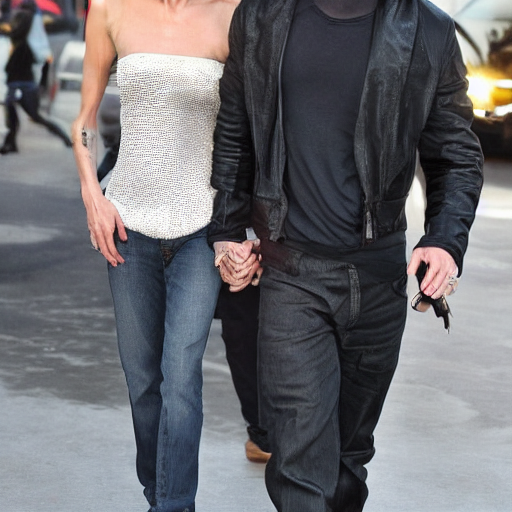

In [10]:
torch.manual_seed(1024)
pipe(prompt, num_inference_steps = 16).images[0]

In [11]:
# define image grid
def image_grid(images, rows, columns):
    width, height = images[0].size
    grid = Image.new('RGB', size = (columns*width, rows*height))
    for i, img in enumerate(images):
        grid.paste(img, box = (i%columns*width, i//columns*height))
    return grid

num_rows, num_cols = 4,4
prompts = [prompt]*num_cols

In [12]:
# define classifier free guidance based prompt
# details: https://sander.ai/2022/05/26/guidance.html
# the more the guidance, the better the text prompt is represented, but the less the diversity of output

images = concat(pipe(prompts, guidance_scale = g).images for g in [1.1, 3, 7, 14])

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

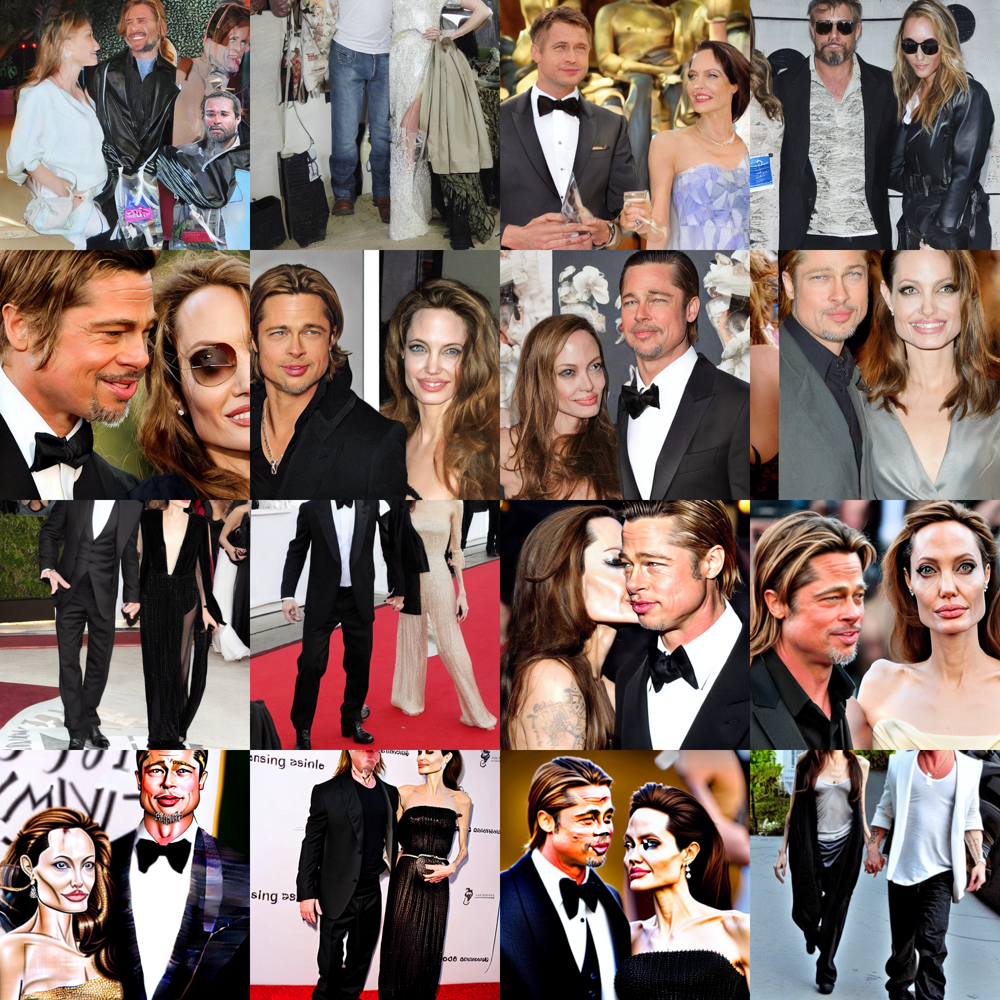

In [13]:
image_grid(images, rows = num_rows, columns = num_cols)

  0%|          | 0/50 [00:00<?, ?it/s]

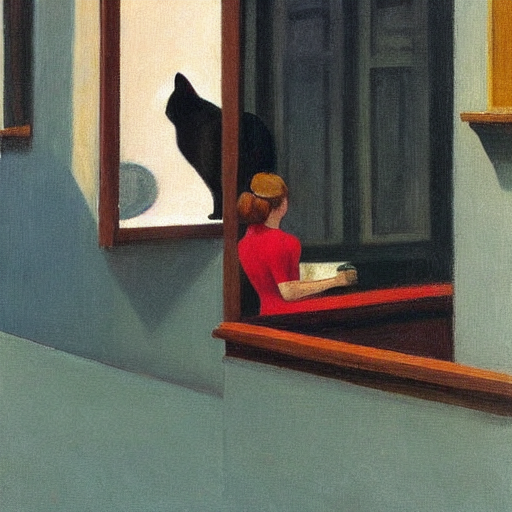

In [14]:
# test negative prompts

torch.manual_seed(1024)
prompt = "A cat in the style of Edward Hopper"
pipe(prompt).images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

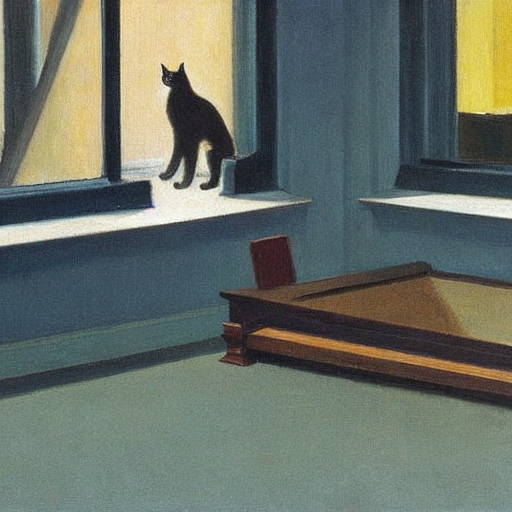

In [15]:
torch.manual_seed(1024)
pipe(prompt, negative_prompt = "red").images[0]

In [16]:
# image to image pipeline

from diffusers import StableDiffusionImg2ImgPipeline
from fastdownload import FastDownload

pipei2i = StableDiffusionImg2ImgPipeline.from_pretrained(
    model_name,
    variant = variant, #fp16
    torch_dtype = torch.float16
).to("cuda")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

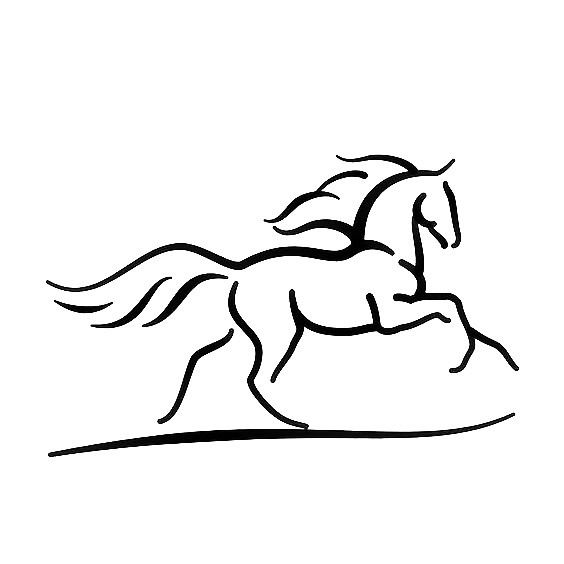

In [22]:
# start with horse guiding point
img_url = 'https://i.pinimg.com/564x/3c/d7/f9/3cd7f9b8a0e74407a2933cdf9d49fde7.jpg'
img_path = FastDownload().download(img_url)
# img_path = '/kaggle/input/stable-diffusion-initialization-experiments/horsie.jpg'
init_image = Image.open(img_path).convert('RGB')
# init_image = init_image.resize((200, 200))
init_image

In [23]:
# pipei2i??

/opt/conda/lib/python3.10/site-packages/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion_img2img.py:750: FutureWarning: You have passed 3 text prompts (`prompt`), but only 1 initial images (`image`). Initial images are now duplicating to match the number of text prompts. Note that this behavior is deprecated and will be removed in a version 1.0.0. Please make sure to update your script to pass as many initial images as text prompts to suppress this warning.
  deprecate("len(prompt) != len(image)", "1.0.0", deprecation_message, standard_warn=False)


  0%|          | 0/45 [00:00<?, ?it/s]

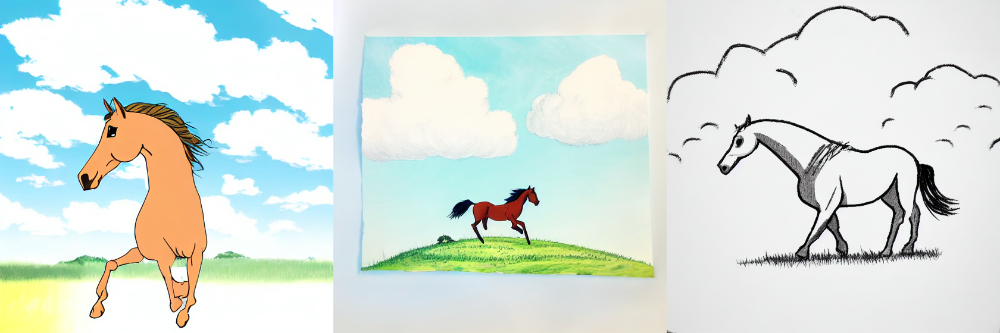

In [40]:
# generate image using initializer

torch.manual_seed(1024)
horse_prompt = "horse running in a meadow with clouds in background; studio ghibli style"
images = pipei2i(
    prompt = horse_prompt,
    num_images_per_prompt = 3,
    image = init_image, # this used to be init_image
    strength = 0.9, # strength conveys degree of influence of prompt over text
    num_inference_steps = 50
).images
image_grid(images, rows = 1, columns = 3)

/opt/conda/lib/python3.10/site-packages/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion_img2img.py:750: FutureWarning: You have passed 3 text prompts (`prompt`), but only 1 initial images (`image`). Initial images are now duplicating to match the number of text prompts. Note that this behavior is deprecated and will be removed in a version 1.0.0. Please make sure to update your script to pass as many initial images as text prompts to suppress this warning.
  deprecate("len(prompt) != len(image)", "1.0.0", deprecation_message, standard_warn=False)


  0%|          | 0/70 [00:00<?, ?it/s]

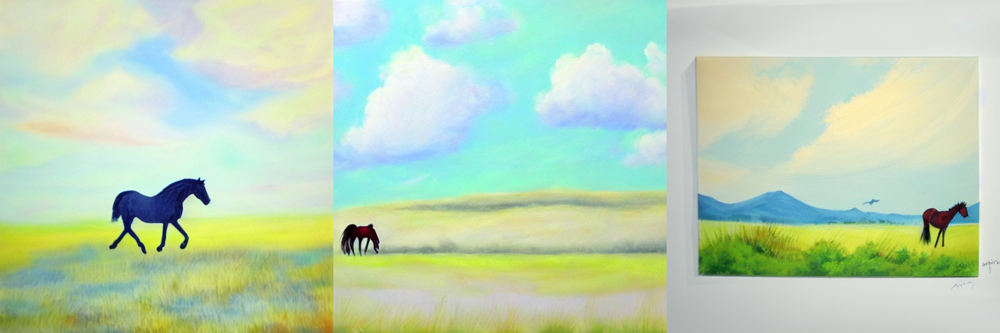

In [44]:
# use second image for initialization
torch.manual_seed(1000)
init_image_2 = images[1]
horse_prompt_2 = "Acryllic painting of a horse running in a meadow with clouds in the background by Maureen Gallace"
images_2 = pipei2i(
    prompt = horse_prompt_2,
    num_images_per_prompt = 3,
    image = init_image_2,
    strength = 1,
    num_inference_steps = 70
).images
image_grid(images_2, rows = 1, columns = 3)

In [50]:
#
# train single token for finetuning
#

# declare new pipe
finetuned_pipe = StableDiffusionPipeline.from_pretrained(
    model_name,
    variant = variant,
    torch_dtype = torch.float16
).to("cuda")

# get embedding URL (currently from external source)
# resolve instead of raw (resolve = download link)
embeds_url = "https://huggingface.co/sd-concepts-library/moebius/resolve/main/learned_embeds.bin"
embeds_path = FastDownload().download(embeds_url)
embeds_dict = torch.load(str(embeds_path), map_location = "cpu")

# create pipe tokenizer
tokenizer = finetuned_pipe.tokenizer
text_encoder = finetuned_pipe.text_encoder
new_token, embeds = next(iter(embeds_dict.items()))
embeds = embeds.to(text_encoder.dtype)
print("New token is: ", new_token)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

New token is:  <moebius>


In [55]:
# add new token to tokenizer and trained embeddings to embedding table
# can't rerun this without re-initializing table so commented it out
# assert tokenizer.add_tokens(new_token) == 1, "Error, token already exists."

# resize to fit model specs
text_encoder.resize_token_embeddings(len(tokenizer))

# generate token id for new token
new_token_id = tokenizer.convert_tokens_to_ids(new_token)

# assign weights in encoder using extracted embeds from model corresponding to new token ID
text_encoder.get_input_embeddings().weight.data[new_token_id] = embeds

  0%|          | 0/50 [00:00<?, ?it/s]

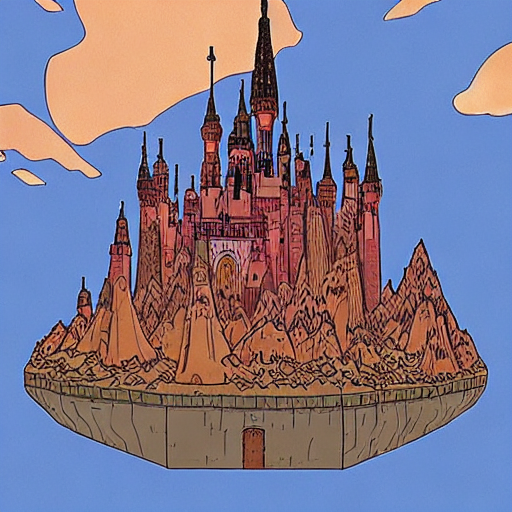

In [69]:
torch.manual_seed(1024)
moebius_image = finetuned_pipe("castle floating in the sky, in the style of <moebius>", negative_prompt = "water").images[0]
moebius_image